# Importing the libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

/Applications/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


# Reading the Data

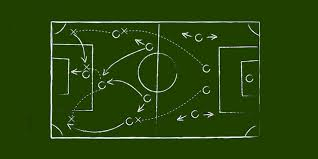

In [2]:
fifa=pd.read_csv('fifa21_male2.csv')
fifa.head()

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/2607369135.py:1: DtypeWarning: Columns (78) have mixed types. Specify dtype option on import or set low_memory=False.
  fifa=pd.read_csv('fifa21_male2.csv')


,ID,Name,Age,OVA,Nationality,Club,BOV,BP,Position,Player Photo,...,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,GK,Gender
0,2,G. Pasquale,33,69,Italy,Udinese,71,LWB,LM,https://cdn.sofifa.com/players/000/002/16_120.png,...,70+-1,70+-1,71+-2,70+-1,69+0,69+0,69+0,70+-1,17+0,Male
1,16,Luis García,37,71,Spain,KAS Eupen,70,CM,CM CAM CDM,https://cdn.sofifa.com/players/000/016/19_120.png,...,66+1,66+1,62+1,60+1,60+1,60+1,60+1,60+1,17+1,Male
2,27,J. Cole,33,71,England,Coventry City,71,CAM,CAM RM RW LM,https://cdn.sofifa.com/players/000/027/16_120.png,...,54+0,54+0,52+0,47+0,46+0,46+0,46+0,47+0,15+0,Male
3,36,D. Yorke,36,68,Trinidad &amp; Tobago,Sunderland,70,ST,NaN,https://cdn.sofifa.com/players/000/036/09_120.png,...,65+0,65+0,56+0,57+0,51+0,51+0,51+0,57+0,22+0,Male
4,41,Iniesta,36,81,Spain,Vissel Kobe,82,CAM,CM CAM,https://cdn.sofifa.com/players/000/041/20_120.png,...,73+3,73+3,70+3,67+3,64+3,64+3,64+3,67+3,17+3,Male


# Checking out the Data Types

In [3]:
fifa.dtypes

ID              int64
Name           object
Age             int64
OVA             int64
Nationality    object
                ...  
CB             object
RCB            object
RB             object
GK             object
Gender         object
Length: 107, dtype: object

# Identifying the null Values

In [4]:
fifa.isnull().sum()

ID             0
Name           0
Age            0
OVA            0
Nationality    0
              ..
CB             0
RCB            0
RB             0
GK             0
Gender         0
Length: 107, dtype: int64

# Cleaning the null values in the rows

In [5]:
fifa['Volleys'].replace({np.NaN:fifa['Volleys'].mean()},inplace=True)
fifa['Curve'].replace({np.NaN:fifa['Curve'].mean()},inplace=True)
fifa['Agility'].replace({np.NaN:fifa['Agility'].mean()},inplace=True)
fifa['Balance'].replace({np.NaN:fifa['Balance'].mean()},inplace=True)
fifa['Jumping'].replace({np.NaN:fifa['Jumping'].mean()},inplace=True)
fifa['Interceptions'].replace({np.NaN:fifa['Interceptions'].mean()},inplace=True)
fifa['Positioning'].replace({np.NaN:fifa['Positioning'].mean()},inplace=True)
fifa['Composure'].replace({np.NaN:fifa['Composure'].mean()},inplace=True)
fifa['Sliding Tackle'].replace({np.NaN:fifa['Sliding Tackle'].mean()},inplace=True)

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/1240838064.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  fifa['Volleys'].replace({np.NaN:fifa['Volleys'].mean()},inplace=True)
/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/1240838064.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are 

# Finding the total count of players available

In [6]:
fifa.Name.nunique()

16176

# What is the nationwise participation in the Game?

In [7]:
nat_cnt=fifa.groupby('Nationality').apply(lambda x:x['Name'].count()).reset_index(name='Counts')
nat_cnt.sort_values(by='Counts',ascending=False,inplace=True)
top_20_nat_cnt=nat_cnt[:20]
fig=px.bar(top_20_nat_cnt,x='Nationality',y='Counts',color='Counts',title='Nationwise Representation in the FIFA Game')
fig.show()

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/3211500442.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  nat_cnt=fifa.groupby('Nationality').apply(lambda x:x['Name'].count()).reset_index(name='Counts')


**Observations** England has the highest number of players in FIFA 21 game. One of the major reasons in this regards is due to the EA franchise, which has predominatingly most user base in UK. Also in FIFA, English League has the most number of teams- generating the most number of players

# Which nation has the most number of over performing players?

![](https://footballia.net/cache/matches/d2487c60b29845f93bbcbcffc8522024.png)

**Note** We have only selected countries that have atleast 150 players in record. This is done in order to avoid any bias

In [8]:
cnt_best_avg=fifa.groupby('Nationality').apply(lambda x:np.average(x['OVA'])).reset_index(name='Overall Ratings')
cnt_best_cnt=fifa.groupby('Nationality').apply(lambda x:x['OVA'].count()).reset_index(name='Player Counts')
snt_best_avg_cnt=pd.merge(cnt_best_avg,cnt_best_cnt,how='inner',left_on='Nationality',right_on='Nationality')
sel_best_avg_cnt=snt_best_avg_cnt[snt_best_avg_cnt['Player Counts']>=200]
sel_best_avg_cnt.sort_values(by=['Overall Ratings','Player Counts'],ascending=[False,False])
px.scatter(sel_best_avg_cnt,x='Overall Ratings',y='Player Counts',color='Player Counts',size='Overall Ratings',hover_data=['Nationality'],title='Nationwise Player counts and Average Potential')


/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/2036825340.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/2036825340.py:2: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



**Observations** England and Brazil are the teams that deserve a mention in this aspect. England since it has produced 1707 players, and still is having an average of 63.64, while Brazil has the highest average Ratings among the players

# What has been the team wise player counts?

In [9]:
clb_cnt=fifa.groupby('Club').apply(lambda x:x['Name'].count()).reset_index(name='Counts')
clb_cnt.sort_values(by='Counts',ascending=False,inplace=True)
fig=px.scatter(clb_cnt,x='Club',y='Counts',color='Counts',title='Clubwise Player counts in FIFA 21')
fig.show()

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/2985839874.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



**Observation** Chealsea and Manchester United have the most number of Players in record as a Club in FIFA 21- 45 players information for both the clubs. Just a general observation, the average count of players for the English Premier League is more tahn any other leage. This shows the prioritization of English football by FIFA

# Which Team has the most number of Over Performing Players?

![](https://i.ytimg.com/vi/qXTX8wtf4sw/maxresdefault.jpg)

**Note** We have only selected clubs that have atleast 25 players in record. This is done in order to avoid any bias

In [10]:
cnt_best_avg=fifa.groupby('Club').apply(lambda x:np.average(x['OVA'])).reset_index(name='Overall Ratings')
cnt_best_cnt=fifa.groupby('Club').apply(lambda x:x['OVA'].count()).reset_index(name='Player Counts')
snt_best_avg_cnt=pd.merge(cnt_best_avg,cnt_best_cnt,how='inner',left_on='Club',right_on='Club')
sel_best_avg_cnt=snt_best_avg_cnt[snt_best_avg_cnt['Player Counts']>=25]
sel_best_avg_cnt.sort_values(by=['Overall Ratings','Player Counts'],ascending=[False,False])
px.scatter(sel_best_avg_cnt,x='Overall Ratings',y='Player Counts',color='Player Counts',size='Overall Ratings',hover_data=['Club'],title='Clubwise player counts and Average Potential')


/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/2813964405.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/2813964405.py:2: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



**Observation** As per the above chart, two teams deserve a special mention in this regard. Firstly it is Bayern Munich- The team which has the highest average rating among all the teams (81.26) from a set of 26 players. Another team is Manchester United- which has the highest average amon the teams with 45 layers. They have an average of 75.866 on the 45 players

# What is the Height vs Weight variation of the Footballers?

In [11]:
props=fifa[['Name','Nationality','Club','Height','Weight']]
props['Ht in ft']=pd.to_numeric(props['Height'].str[0])
props['Ht in in']=pd.to_numeric(props['Height'].str.split("\'").str[1].str.strip('"'))
props['Ht in cm']=(props['Ht in ft']*12+props['Ht in in'])*2.54
props['Weight in lb']=pd.to_numeric(props['Weight'].str.strip('lbs'))
fig=px.scatter(props,x='Weight in lb',y='Ht in cm',color='Ht in cm',size='Weight in lb',hover_data=['Name','Nationality','Club'],title='Height vs Weight Variation of the players in FIFA 21')
fig.show()

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/3188248403.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/3188248403.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/3188248403.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

**Observation** Generally for a healthy football player, the height and weight are in a proportion. Else he/she willto be too weak/heavy- and not have the peak fitness form. This is seen from the above scatter plot.

# Count of players position wise

In [12]:
pos_cnt=fifa.groupby('BP').apply(lambda x:x['Name'].count()).reset_index(name='Counts')
pos_cnt.sort_values(by='Counts',ascending=False,inplace=True)
top_20_pos_cnt=pos_cnt[:20]
fig=px.bar(top_20_pos_cnt,x='BP',y='Counts',color='Counts',title='Positionwise Player counts in FIFA 21')
fig.show()

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/3760697610.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



**Observation** In FIFA 21, the most number of player population is for the Center Back Position, which is followed by Striker and The Central attacking midfielder positions.

# What is the age Distribution of the players?

In [13]:
age_cnt=fifa.groupby('Age').apply(lambda x:x['Name'].count()).reset_index(name='Counts')
fig=px.bar(age_cnt,x='Age',y='Counts',color='Counts',title='Agewise Player distribution in FIFA 21')
fig.show()

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/380229794.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



**Observation** The chart looks like a normal curve which is left skewed. On an average 20-24 is the average age for most of the footballers in FIFA21

# What is the distibution of Market Value and Wage for the players?

In [14]:
cost_prop=fifa[['Name','Club','Nationality','Wage','Value','BP']]
cost_prop['MultW']=np.where(cost_prop.Wage.str[-1]=='K',1000,1)
cost_prop['Wage']=cost_prop.Wage.str.strip('K')
cost_prop['Wage']=cost_prop.Wage.str.strip('€')
cost_prop['Wage']=pd.to_numeric(cost_prop['Wage'])
cost_prop['Wage in €']=cost_prop['Wage']*cost_prop['MultW']
cost_prop['MultV']=np.where(cost_prop.Value.str[-1]=='K',1000,np.where(cost_prop.Value.str[-1]=='M',1000000,1))
cost_prop['Value']=cost_prop.Value.str.strip('€')
cost_prop['Value']=cost_prop.Value.str.strip('K')
cost_prop['Value']=cost_prop.Value.str.strip('M')
cost_prop['Value']=pd.to_numeric(cost_prop['Value'])
cost_prop['Value in €']=cost_prop['Value']*cost_prop['MultV']
fig=px.scatter(cost_prop,x='Value in €',y='Wage in €',color='Value in €',size='Wage in €',hover_data=['Name','Club','Nationality','BP'],title='Value vs Wage Presentation of all the Players')
fig.show()

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/2389891632.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/2389891632.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/2389891632.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

**Observation** Lionel Messi tops the chart as the player with the highest wage. While Kylian Mbappe tops in terms of Market value. A general observation, we see the forward players usually having a higher Value and Wages. Is there a bias? Lets deep dive later!

# How does the game attributes vary with position?

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/3005666391.py:6: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/3005666391.py:7: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/3005666391.py:8: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping column

Overall Attributes of the Players in FIFA 21


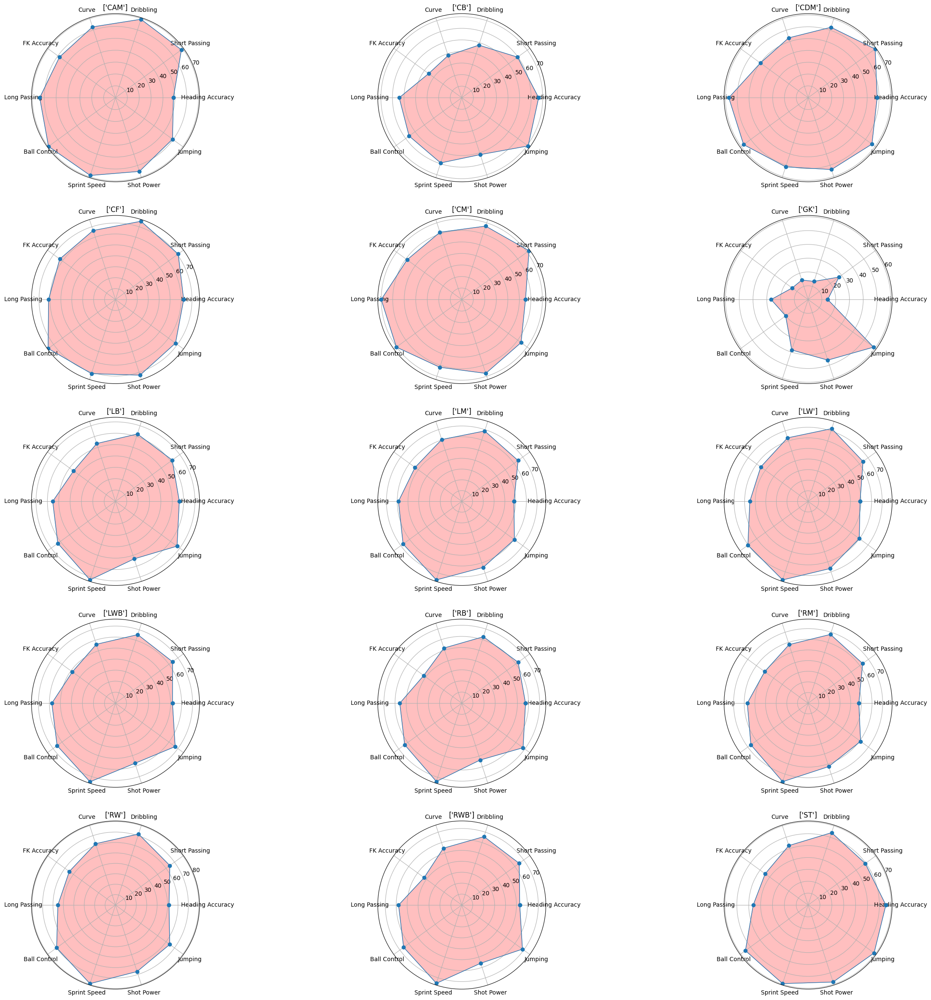

In [17]:
%matplotlib inline
import pandas as pd
import seaborn as sns


pos_head=fifa.groupby('BP').apply(lambda x:np.average(x['Heading Accuracy'])).reset_index(name='Heading Accuracy')
pos_sp=fifa.groupby('BP').apply(lambda x:np.average(x['Short Passing'])).reset_index(name='Short Passing')
pos_d=fifa.groupby('BP').apply(lambda x:np.average(x['Dribbling'])).reset_index(name='Dribbling')
pos_c=fifa.groupby('BP').apply(lambda x:np.average(x['Curve'])).reset_index(name='Curve')
pos_fk=fifa.groupby('BP').apply(lambda x:np.average(x['FK Accuracy'])).reset_index(name='FK Accuracy')
pos_lp=fifa.groupby('BP').apply(lambda x:np.average(x['Long Passing'])).reset_index(name='Long Passing')
pos_bc=fifa.groupby('BP').apply(lambda x:np.average(x['Ball Control'])).reset_index(name='Ball Control')
pos_ss=fifa.groupby('BP').apply(lambda x:np.average(x['Sprint Speed'])).reset_index(name='Sprint Speed')
pos_spo=fifa.groupby('BP').apply(lambda x:np.average(x['Shot Power'])).reset_index(name='Shot Power')
pos_jm=fifa.groupby('BP').apply(lambda x:np.average(x['Jumping'])).reset_index(name='Jumping')

pos_overall1=pd.merge(pos_head,pos_sp,how='inner',left_on='BP',right_on='BP')
pos_overall2=pd.merge(pos_d,pos_c,how='inner',left_on='BP',right_on='BP')
pos_overall3=pd.merge(pos_fk,pos_lp,how='inner',left_on='BP',right_on='BP')
pos_overall4=pd.merge(pos_bc,pos_ss,how='inner',left_on='BP',right_on='BP')
pos_overall5=pd.merge(pos_spo,pos_jm,how='inner',left_on='BP',right_on='BP')
pos_overall11=pd.merge(pos_overall1,pos_overall2,how='inner',left_on='BP',right_on='BP')
pos_overall22=pd.merge(pos_overall3,pos_overall4,how='inner',left_on='BP',right_on='BP')
pos_overall12=pd.merge(pos_overall11,pos_overall22,how='inner',left_on='BP',right_on='BP')
pos_overall=pd.merge(pos_overall12,pos_overall5,how='inner',left_on='BP',right_on='BP')
print('Overall Attributes of the Players in FIFA 21')
fig=plt.figure(figsize=(30,30))
for i in range(0,15):
    labels=np.array(['Heading Accuracy',
                     'Short Passing', 
                     'Dribbling', 
                     'Curve',
                     'FK Accuracy',
                     'Long Passing',
                     'Ball Control',
                     'Sprint Speed',
                     'Shot Power',
                     'Jumping'])
    stats=pos_overall.loc[i,labels].values

    angles=np.linspace(0, 2*np.pi, len(labels), endpoint=False)
    # close the plot
    stats=np.concatenate((stats,[stats[0]]))
    angles=np.concatenate((angles,[angles[0]]))

    
    ax = fig.add_subplot(5,3,i+1, polar=True)
    ax.plot(angles, stats, 'o-', linewidth=1)
    ax.fill(angles, stats,color='red',alpha=0.25)
    ax.set_thetagrids(angles[:-1] * 180/np.pi, labels)
    ax.set_title([pos_overall.loc[i,"BP"]])
    ax.grid(True)


**Observation** All overall game attributes have been considered. The paramters considered here have a slight bias against the Goalkeepers, But will be working upon to improve the same. Overall among the selected categories, we see the Center Half players and the Center Forwards have a better performance matrix as compared to the rest of the positions 

# Who are the best players in the game?

![](https://icdn.juvefc.com/wp-content/uploads/2020/10/Ronaldo-Messi.jpg)

In [18]:
top_play=fifa[['Name','OVA',"Age",'Club','BP']]
top_play.sort_values(by='OVA',ascending=False,inplace=True)
top_30_play=top_play[:100]
fig=px.scatter(top_30_play,x='Age',y='OVA',color='Age',size='OVA',hover_data=['Name','Club','BP'],title='Top Football Players in the FIFA 21 game')
fig.show()

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/1123887366.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



**Observation** I guess any fan of this beautiful game would accept that we have the 2 best players of this era currently playing- Lionel Messi and Cristiano Ronaldo. But they are now at the age of 33 and 35 respectively- and have a last few years in their hand. Among the youngest players, Kylian Mbappe, Jadon Snacho and Trent Alexander Arnold deserve a special mention.

# Who are the Players with the highest Potential??

PS. We will remove the players whose meximum potential is their current form. This was done primarily in order to select the younger players who shall be the top players in the recent future. Hence we have also kept a filter which will help us to identify the best players under the age of 27

In [19]:
cond_1=fifa['OVA']!=fifa['POT']
cond_2=fifa['Age']<25
fifa_fil=fifa[cond_1 & cond_2]
pot_play=fifa_fil[['Name','Age','Nationality','Club','POT','BP','OVA','Value','Release Clause']]
pot_play.sort_values(by='POT',ascending=False,inplace=True)
top_pot_play=pot_play[:50]
fig=px.scatter(pot_play,x='Age',y='POT',size='POT',color='Age',hover_data=['Name','Age','Nationality','BP','OVA','Value','Release Clause'],title='Age vs Maximum Potential Distribution of the young Players')
fig.show()

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/2360760120.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



**Observation** Kylian Mabappe tops the chart of players who have the maximum potential, and is justified as the cover picture of the FIFA game. Closely following are Sancho, Vinicius Jr., Felix and K. Havertz. Undoubtedly they are the most sought after players currently as seen by their market value and the release clause.

# Lets Create some Fantasy Football Teams!!!

# Most Preffered Formation:-    3-4-3

# Why?# 

Personnaly I am able to choose the best player from each position- and hence create the most powerful team. Secondly, as I am a fan of passing football, this formation helps to distribute my game to the maximum. Hence, I shall be making the teams here with this formation.

# Best overall Team in Fifa 21

In [21]:
final_team=fifa[['Name','Age','OVA','BP','Club']]
final_team.sort_values(by='Age',inplace=True)
pos_play=final_team.groupby('BP').apply(lambda x:np.max(x['OVA'])).reset_index(name='Overall Score')
player_pos=pd.merge(final_team,pos_play,how='inner',left_on=['BP','OVA'],right_on=['BP','Overall Score'])
pos_best=player_pos[['Name','Club','Age','BP','Overall Score']]
cm = sns.light_palette("yellow", as_cmap=True) 
pos_best.style.background_gradient(cmap=cm).format(precision=2)


/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/2746767661.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/2746767661.py:3: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,Name,Club,Age,BP,Overall Score
0,T. Alexander-Arnold,Liverpool,21,RB,87
1,M. Rashford,Manchester United,22,RM,85
2,S. Gnabry,FC Bayern München,24,RM,85
3,A. Robertson,Liverpool,26,LB,87
4,H. Son,Tottenham Hotspur,27,LM,87
5,J. Oblak,Atlético Madrid,27,GK,91
6,Casemiro,Real Madrid,28,CDM,89
7,V. van Dijk,Liverpool,28,CB,90
8,Neymar Jr,Paris Saint-Germain,28,LW,91
9,K. De Bruyne,Manchester City,29,CAM,91


# Let's check out the Best playing 11 in our required formation

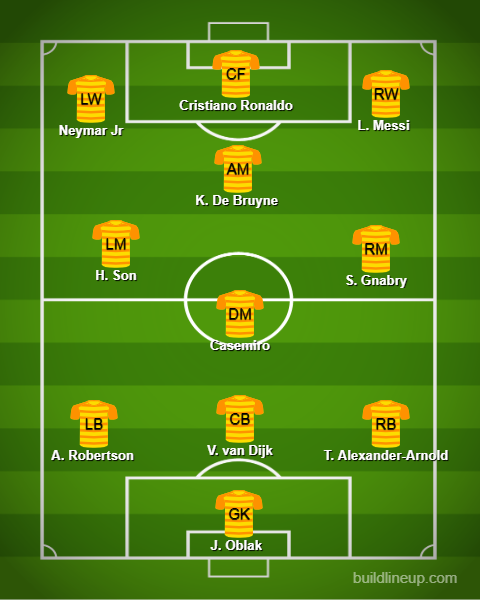

**Observation** Wow, I would not even dare to play against this team... too much power packed it is!

# Lets make the Team with the players with the highest potential

**Note** The Potential cannot be equal to the Overall Score, and the age of the players must be smaller than 25

In [23]:
final_team=fifa_fil[['Name','Age','POT','BP','Club']]
final_team.sort_values(by='Age',inplace=True)
pos_play=final_team.groupby('BP').apply(lambda x:np.max(x['POT'])).reset_index(name='Potential')
player_pos=pd.merge(final_team,pos_play,how='inner',left_on=['BP','POT'],right_on=['BP','Potential'])
pos_best=player_pos[['Name','Club','Age','BP','Potential']]
cm = sns.light_palette("black", as_cmap=True) 
pos_best.style.background_gradient(cmap=cm).format(precision=2)


/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/2641047666.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/2641047666.py:3: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,Name,Club,Age,BP,Potential
0,Ansu Fati,FC Barcelona,17,LW,90
1,J. Doku,RSC Anderlecht,18,RW,88
2,Vinícius Jr.,Real Madrid,19,RM,93
3,A. Davies,FC Bayern München,19,LB,89
4,S. Tonali,Milan,20,CM,91
5,João Félix,Atlético Madrid,20,CAM,93
6,J. Sancho,Borussia Dortmund,20,CAM,93
7,M. de Ligt,Juventus,20,CB,92
8,Dodô,Shakhtar Donetsk,21,RWB,86
9,T. Alexander-Arnold,Liverpool,21,RB,92


# Lets select the playing XI which has the maximum potential to be the ultimate team in the recent future

Note: In case of 2 playes having the same potential, we have selected the younger player to represent the team. 

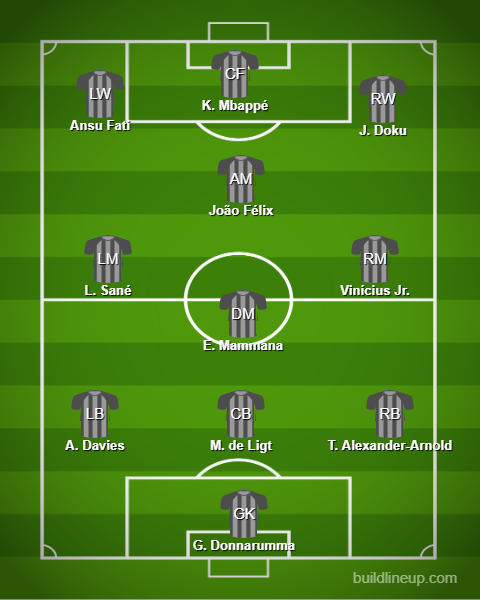

**Observation** Only 1 player- Trent Alexander-Arnold is common between both the teams, indicating his terrific performance with respect to his age. But seriously, this team can be a real threat to the top team in FIFA 21! Challenge is now accepted!

# Lets create the best fantasy Team for English Premier League!

In [25]:
epl_team=fifa[fifa.Club.isin(['Manchester United','Manchester City','Newcastle United','Hull City','Stoke City','Bournemouth',
                                'Nottingham Forest','Portsmouth','Sheffield Wednesday','Charlton Athletic',
                                'Huddersfield Town','Wolverhampton Wanderers','Oxford United','Arsenal de Sarandí','Everton',
                                'Bolton Wanderers','Liverpool','Derby County','Arsenal','Tottenham Hotspur',
                                'Birmingham City','Swansea City','Chelsea','Middlesbrough','Barnsley','Norwich City',
                                'Watford','Swindon Town','Coventry City','Leicester City','Ipswich Town',
                                'Cardiff City','Burnley','Wigan Athletic','Crystal Palace','West Ham United',
                                'Bristol City','Sheffield United','Oldham Athletic','Southampton','Leeds United','Liverpool Fútbol Club'])]
epl_final_team=epl_team[['Name','Age','OVA','BP','Club']]
epl_final_team.sort_values(by='Age',inplace=True)
pos_play=epl_final_team.groupby('BP').apply(lambda x:np.max(x['OVA'])).reset_index(name='Overall Score')
player_pos=pd.merge(epl_final_team,pos_play,how='inner',left_on=['BP','OVA'],right_on=['BP','Overall Score'])
pos_best=player_pos[['Name','Club','Age','BP','Overall Score']]
cm = sns.light_palette("red", as_cmap=True) 
pos_best.style.background_gradient(cmap=cm).format(precision=2)


/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/3478517245.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/3478517245.py:11: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,Name,Club,Age,BP,Overall Score
0,T. Alexander-Arnold,Liverpool,21,RB,87
1,M. Rashford,Manchester United,22,RM,85
2,B. Mendy,Manchester City,25,LWB,81
3,João Cancelo,Manchester City,26,RWB,83
4,Jonny,Wolverhampton Wanderers,26,LWB,81
5,A. Robertson,Liverpool,26,LB,87
6,Nélson Semedo,Wolverhampton Wanderers,26,RWB,83
7,Alisson,Liverpool,27,GK,90
8,H. Son,Tottenham Hotspur,27,LM,87
9,P. Pogba,Manchester United,27,CM,86


# Let's check out one of the best teams of English Premier League in Fifa 21

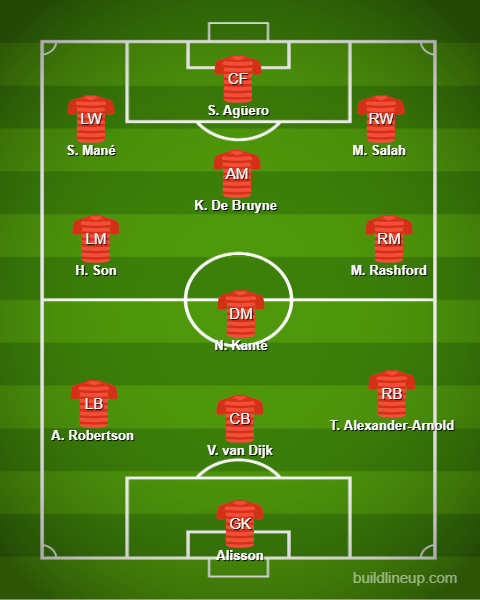

**Observation** Well if this team would play in the Premier League, even the Classic XI would fall. Truly a great combination of players

# Now, Let's check for the Team I support... FC Barcelona

# Who are the best agewise players in BARCA???

In [26]:
barca_team_all_players=fifa[fifa['Club']=='FC Barcelona']
barca_team_all_players

,ID,Name,Age,OVA,Nationality,Club,BOV,BP,Position,Player Photo,...,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,GK,Gender
35,1615,L. Thuram,35,83,France,FC Barcelona,83,CB,CB,https://cdn.sofifa.com/players/001/615/08_120.png,...,78+0,78+0,78+0,81+0,83+0,83+0,83+0,81+0,25+0,Male
104,10535,Xavi,34,86,Spain,FC Barcelona,85,CAM,CM,https://cdn.sofifa.com/players/010/535/15_120.png,...,77+2,77+2,74+2,69+2,63+2,63+2,63+2,69+2,13+2,Male
117,13038,Puyol,35,83,Spain,FC Barcelona,82,CB,CB,https://cdn.sofifa.com/players/013/038/14_120.png,...,74+1,74+1,71+1,76+1,82+1,82+1,82+1,76+1,14+1,Male
314,110082,Pinto,37,72,Spain,FC Barcelona,72,GK,NaN,https://cdn.sofifa.com/players/110/082/14_120.png,...,35+0,35+0,31+0,31+0,34+0,34+0,34+0,31+0,72+0,Male
643,152729,Piqué,33,86,Spain,FC Barcelona,86,CB,CB,https://cdn.sofifa.com/players/152/729/20_120.png,...,83+3,83+3,76+3,78+3,84+2,84+2,84+2,78+3,20+3,Male
752,158023,L. Messi,33,93,Argentina,FC Barcelona,93,RW,RW ST CF,https://cdn.sofifa.com/players/158/023/20_120.png,...,65+3,65+3,66+3,62+3,52+3,52+3,52+3,62+3,19+3,Male
1632,180206,M. Pjanić,30,85,Bosnia Herzegovina,FC Barcelona,85,CM,CM CDM,https://cdn.sofifa.com/players/180/206/20_120.png,...,81+3,81+3,79+3,77+3,73+3,73+3,73+3,77+3,16+3,Male
2385,189242,Coutinho,28,83,Brazil,FC Barcelona,83,CAM,CAM LW CM,https://cdn.sofifa.com/players/189/242/20_120.png,...,67+3,67+3,69+3,65+3,57+3,57+3,57+3,65+3,18+3,Male
2398,189332,Jordi Alba,31,86,Spain,FC Barcelona,86,LB,LB,https://cdn.sofifa.com/players/189/332/20_120.png,...,80+3,80+3,83+3,82+3,77+3,77+3,77+3,82+3,20+3,Male
2435,189511,Sergio Busquets,31,87,Spain,FC Barcelona,87,CDM,CDM,https://cdn.sofifa.com/players/189/511/20_120.png,...,84+3,84+3,77+3,76+3,80+3,80+3,80+3,76+3,17+3,Male


**Observation** We see some of the players are present in the list- who have retired from the game. This might be an issue in the data. Hence let us remove those players from the team level analysis. We only keep the list of those players who have their contract ending after 2020.

**Keeping only the eligible players**

In [27]:
barca_team_all_players['Contract Start']=pd.to_numeric(barca_team_all_players['Contract'].str.split(' ~ ').str[0])
barca_team_all_players['Contract End']=pd.to_numeric(barca_team_all_players['Contract'].str.split(' ~ ').str[-1])
barca_team_all=barca_team_all_players[barca_team_all_players['Contract End']>2020]

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/3650230660.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/3650230660.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# Agewise best players in Barcelona Team...

In [29]:
barca_team=barca_team_all[['Name','Age','OVA','BP']]
barca_team.sort_values(by='Age',inplace=True)
age_play=barca_team.groupby('Age').apply(lambda x:np.max(x['OVA'])).reset_index(name='Overall Score')
player_age=pd.merge(barca_team,age_play,how='inner',left_on=['Age','OVA'],right_on=['Age','Overall Score'])
age_best=player_age[['Name','Age','BP','Overall Score']]
cm = sns.light_palette("green", as_cmap=True) 
age_best.style.background_gradient(cmap=cm).format(precision=2)


/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/2554811345.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/2554811345.py:3: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,Name,Age,BP,Overall Score
0,Ansu Fati,17,LW,76
1,K. de la Fuente,18,RM,63
2,Gustavo Maia,19,CAM,69
3,Trincão,20,CAM,78
4,Malcom,21,CAM,82
5,Aleñá,22,CAM,74
6,F. de Jong,23,CM,85
7,C. Lenglet,25,CB,85
8,S. Umtiti,26,CB,83
9,Rafinha,27,CAM,79


# Who are the best position players in Barca???

In [31]:
barca_team_2=barca_team_all[['Name','Age','OVA','BP']]
barca_team_2.sort_values(by='BP',inplace=True)
age_play=barca_team_2.groupby('BP').apply(lambda x:np.max(x['OVA'])).reset_index(name='Overall Score')
player_pos=pd.merge(barca_team_2,age_play,how='inner',left_on=['BP','OVA'],right_on=['BP','Overall Score'])
pos_best=player_pos[['Name','Age','BP','Overall Score']]
cm = sns.light_palette("blue", as_cmap=True) 
pos_best.style.background_gradient(cmap=cm).format(precision=2)


/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/1796703359.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/1796703359.py:3: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,Name,Age,BP,Overall Score
0,Coutinho,28,CAM,83
1,Piqué,33,CB,86
2,Sergio Busquets,31,CDM,87
3,F. de Jong,23,CM,85
4,M. Pjanić,30,CM,85
5,M. ter Stegen,28,GK,90
6,Jordi Alba,31,LB,86
7,O. Dembélé,23,LM,83
8,Ansu Fati,17,LW,76
9,Sergi Roberto,28,RB,83


# Let's make the Dream formation for the Barca Team using the analysis above!

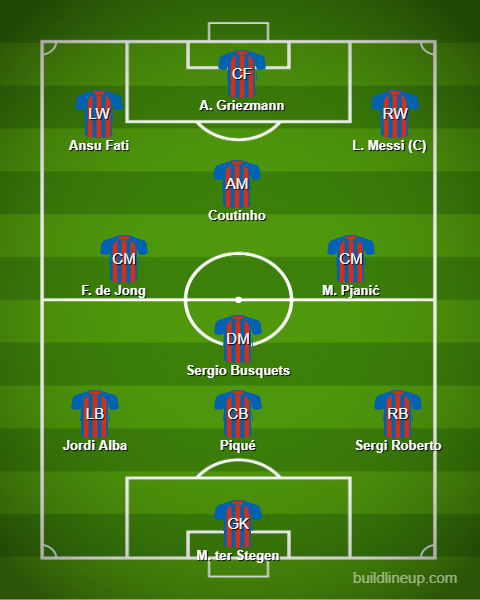

**Observation** Well this would be the Team I would want in Barca. Have still not been able to come out of the 8-2 nightmare by Bayern Munich. But Keeping the fingers crossed!

# Finally, I would like to make a team for my very country... India

![](https://lh3.googleusercontent.com/proxy/f4BDai_DGZFqT4IkTyirKdT4tWyh8F9C9RBjw21ixDI_4C9r-EURw0O_8GMus_mYlQ9cO1qopG23p_D_EQMAgx7qXVmHcZsDlKPBONLHsBfwkfElIPc3_7I-UNhcnsxnyTNd1esr)

In [33]:
india_team_all_players=fifa[fifa['Nationality']=='India']
india_team_2=india_team_all_players[['Name','Age','OVA','BP']]
india_team_2.sort_values(by='BP',inplace=True)
age_play=india_team_2.groupby('BP').apply(lambda x:np.max(x['OVA'])).reset_index(name='Overall Score')
player_pos=pd.merge(india_team_2,age_play,how='inner',left_on=['BP','OVA'],right_on=['BP','Overall Score'])
pos_best=player_pos[['Name','Age','BP','Overall Score']]
cm = sns.light_palette("cyan", as_cmap=True) 
pos_best.style.background_gradient(cmap=cm).format(precision=2)

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/2100336677.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/dt/lnc313ld61bfwvn1rgjkmj_40000gn/T/ipykernel_3826/2100336677.py:4: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,Name,Age,BP,Overall Score
0,A. Swaminathan,28,CAM,61
1,A. Chakraborty,34,CB,61
2,B. Sidhu,32,CM,60
3,G. Chatterjee,34,GK,64
4,A. Ginti,26,LB,61
5,T. Agarwal,34,LM,58
6,L. Ralte,25,LW,61
7,B. Raj,32,RB,64
8,H. Bhandari,31,RM,62
9,U. Singh,22,RW,60


# Lets make the Team for India as done above!

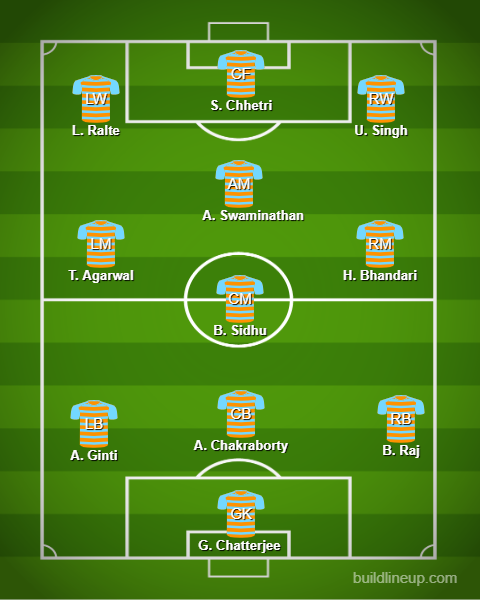